In [42]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from skimage.util import random_noise

# Ques1

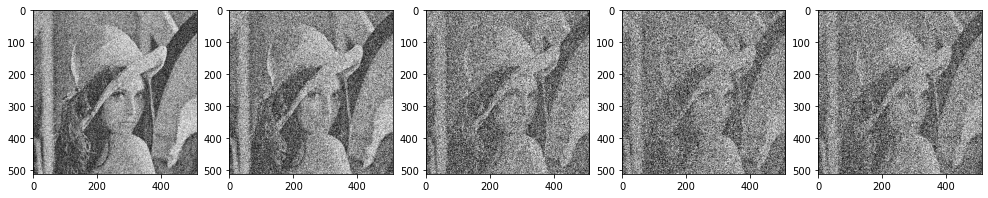

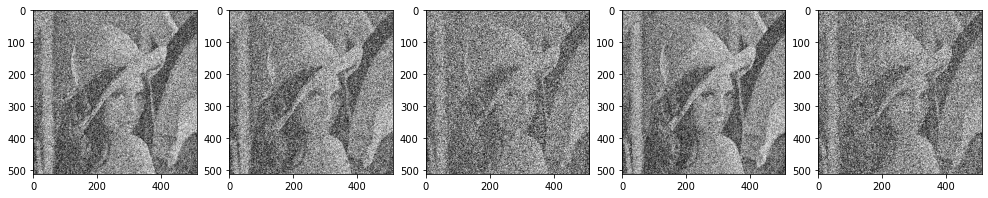

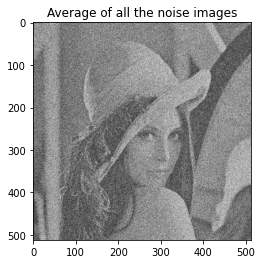

In [53]:
lena=cv2.imread('Lena.png',0)
total=0
#Add gaussian noise to lena image
noise1_img = random_noise(lena, mode='gaussian', mean=0,var=0.1)
noise2_img = random_noise(lena, mode='gaussian', mean=0,var=0.2)
noise3_img = random_noise(lena, mode='gaussian', mean=0,var=0.5)
noise4_img = random_noise(lena, mode='gaussian', mean=0,var=0.8)
noise5_img = random_noise(lena, mode='gaussian', mean=0,var=0.6)
noise6_img = random_noise(lena, mode='gaussian', mean=0,var=0.3)
noise7_img = random_noise(lena, mode='gaussian', mean=0,var=0.4)
noise8_img = random_noise(lena, mode='gaussian', mean=0,var=0.9)
noise9_img = random_noise(lena, mode='gaussian', mean=0,var=0.28)
noise10_img = random_noise(lena, mode='gaussian',mean=0,var=0.7)

fig, ax = plt.subplots(1,5,figsize=(17,17))
ax[0].imshow(noise1_img,cmap='gray')
ax[1].imshow(noise2_img,cmap='gray')
ax[2].imshow(noise3_img,cmap='gray')
ax[3].imshow(noise4_img,cmap='gray')
ax[4].imshow(noise5_img,cmap='gray')
fig, aa = plt.subplots(1,5,figsize=(17,17))
aa[0].imshow(noise6_img,cmap='gray')
aa[1].imshow(noise7_img,cmap='gray')
aa[2].imshow(noise8_img,cmap='gray')
aa[3].imshow(noise9_img,cmap='gray')
aa[4].imshow(noise10_img,cmap='gray')
plt.show()
#take average of all the noise images
noise = np.array([noise1_img,noise2_img,noise3_img,noise4_img,noise5_img,noise6_img,noise7_img,noise8_img,noise9_img,noise10_img])
for i in range(0,len(noise)):
    total=total+noise[i]

average_noise =total/len(noise)

plt.imshow(average_noise,cmap='gray')
plt.title('Average of all the noise images')
plt.show()


# Ques2

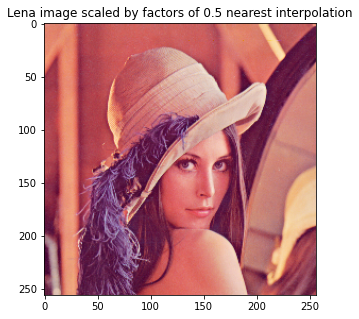

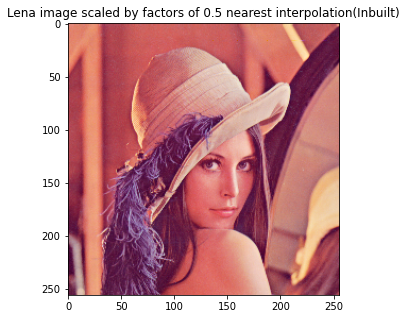

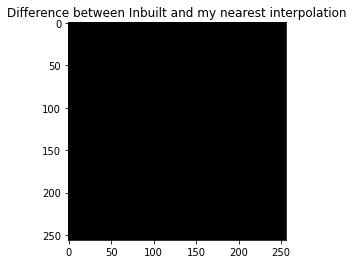

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]


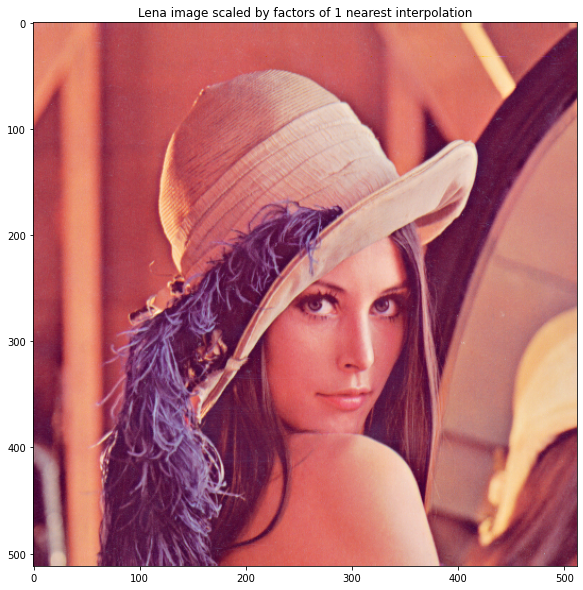

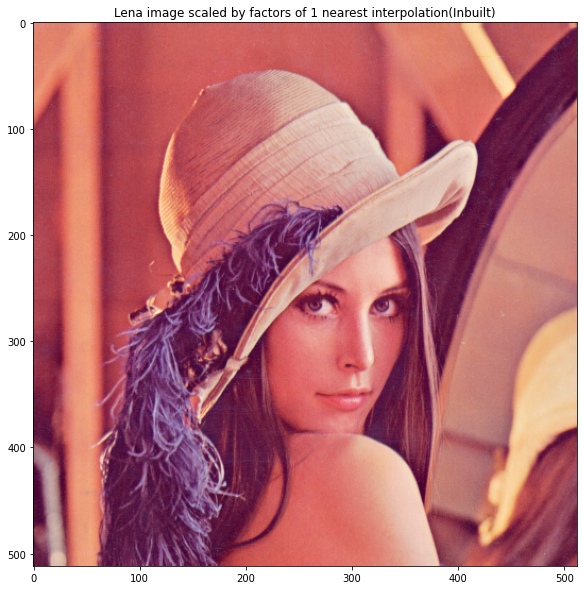

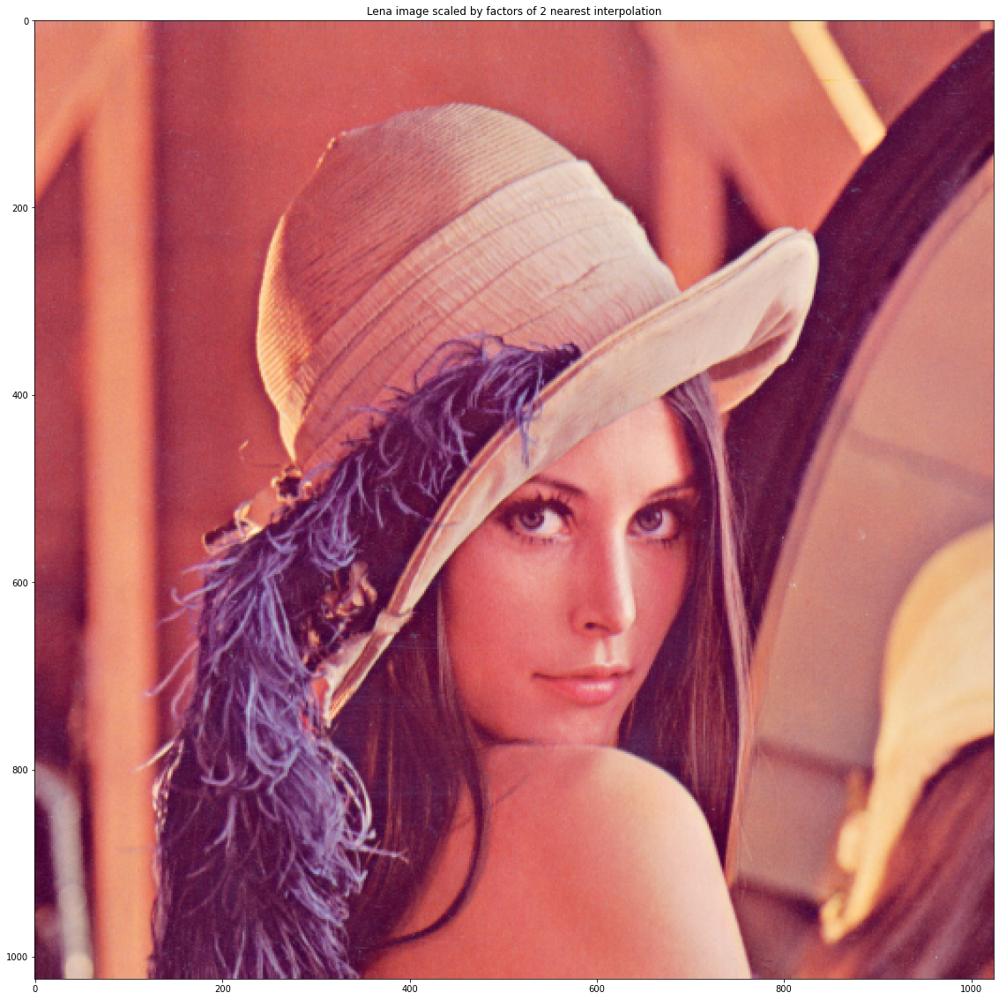

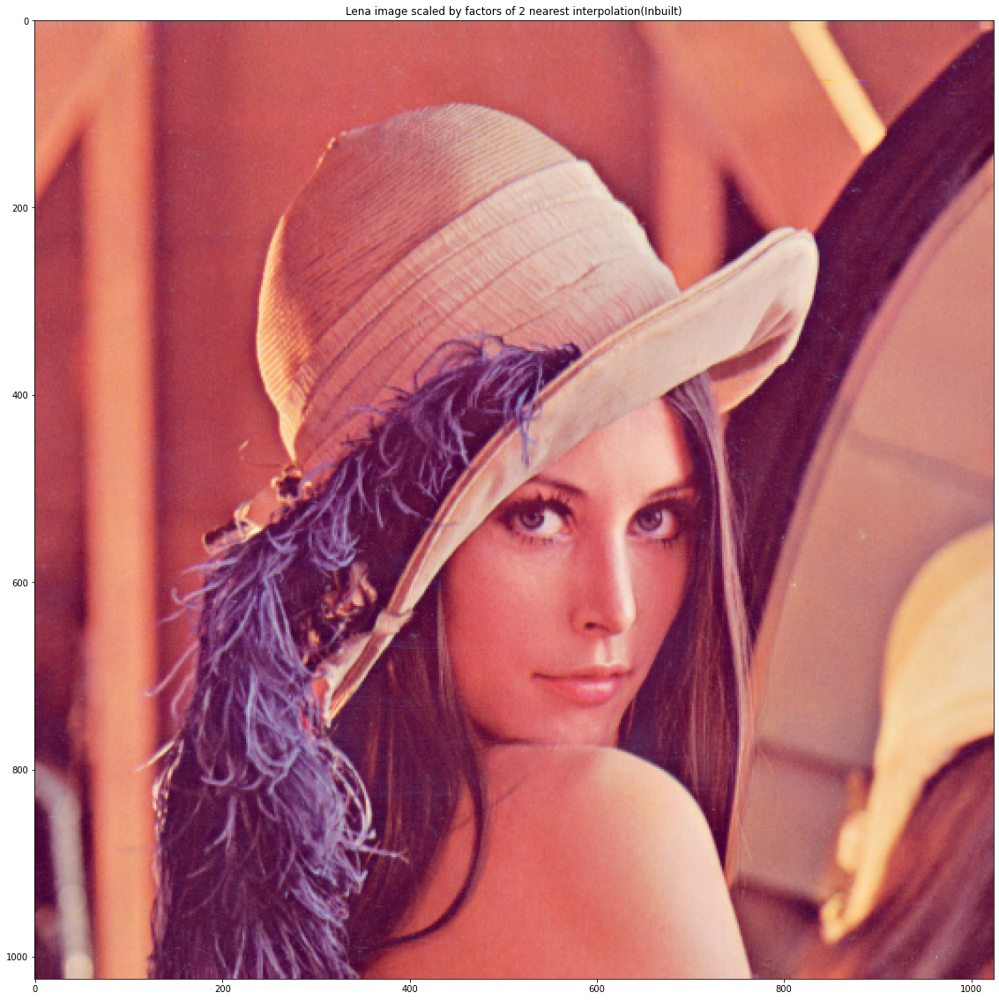

In [45]:
#Nearest Neighbour Interpolation

import math
def nn(img,scale):
    w1=img.shape[1]
    h1=img.shape[0]
    w2=(math.floor(w1*scale))
    h2=(math.floor(h1*scale))
    img_nn = np.empty((w2,h2,3),dtype=np.uint8)

    for i in range(0,w2):
        for j in range(0,h2):
            p_x=math.floor(i*(1/scale))
            p_y=math.floor(j*(1/scale))
            img_nn[j,i]=img[int(p_y),int(p_x)]
    return img_nn

img=cv2.imread('Lena.png')
nnimg1=nn(img,0.5)
nnimg2=nn(img,1)
nnimg3=nn(img,2)

#######################################
plt.figure(figsize=(5,5))
plt.imshow(cv2.cvtColor(nnimg1,cv2.COLOR_BGR2RGB))
plt.title('Lena image scaled by factors of 0.5 nearest interpolation')
plt.show()

lena_scaled_nearest_5 = cv2.resize(img,None,fx=0.5,fy=0.5,interpolation=cv2.INTER_NEAREST)
plt.figure(figsize=(5,5))
plt.imshow(cv2.cvtColor(lena_scaled_nearest_5,cv2.COLOR_BGR2RGB))
plt.title('Lena image scaled by factors of 0.5 nearest interpolation(Inbuilt)')
plt.show()

sub=cv2.subtract(lena_scaled_nearest_5,nnimg1)
plt.imshow(cv2.cvtColor(sub,cv2.COLOR_BGR2RGB))
plt.title('Difference between Inbuilt and my nearest interpolation')
plt.show()

print(sub)


#############################
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(nnimg2,cv2.COLOR_BGR2RGB))
plt.title('Lena image scaled by factors of 1 nearest interpolation')
plt.show()

lena_scaled_nearest1 =cv2.resize(img,None,fx=1.0,fy=1.0,interpolation=cv2.INTER_NEAREST)
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(lena_scaled_nearest1,cv2.COLOR_BGR2RGB))
plt.title('Lena image scaled by factors of 1 nearest interpolation(Inbuilt)')
plt.show()

####################################
plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(nnimg3,cv2.COLOR_BGR2RGB))
plt.title('Lena image scaled by factors of 2 nearest interpolation')
plt.show()

lena_scaled_nearest2 =  cv2.resize(img,None,fx=2.0,fy=2.0,interpolation=cv2.INTER_NEAREST)
plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(lena_scaled_nearest2,cv2.COLOR_BGR2RGB))
plt.title('Lena image scaled by factors of 2 nearest interpolation(Inbuilt)')
plt.show()



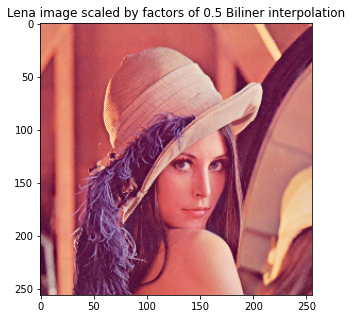

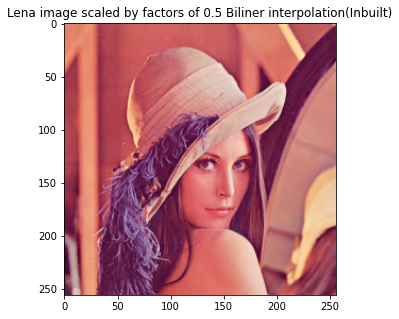

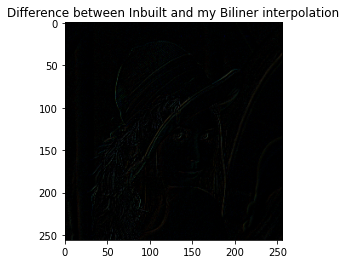

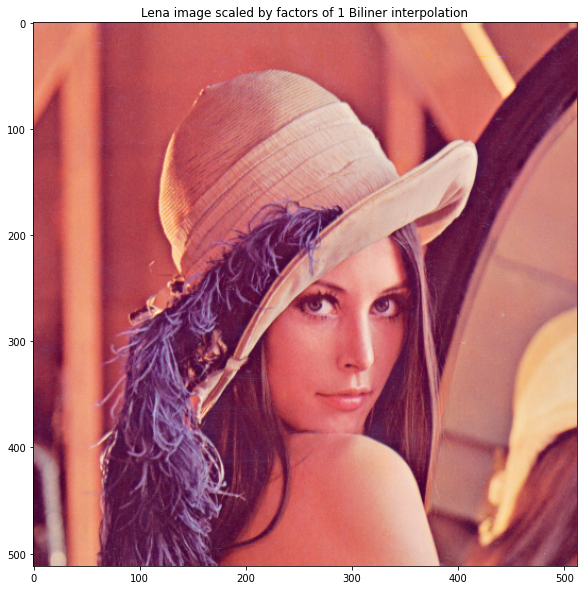

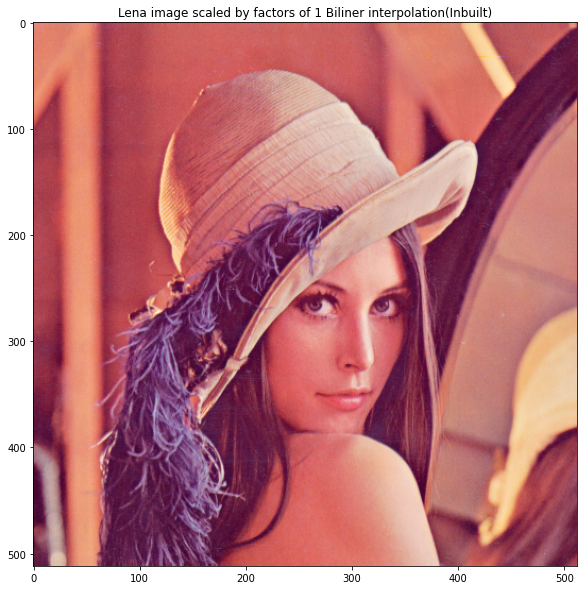

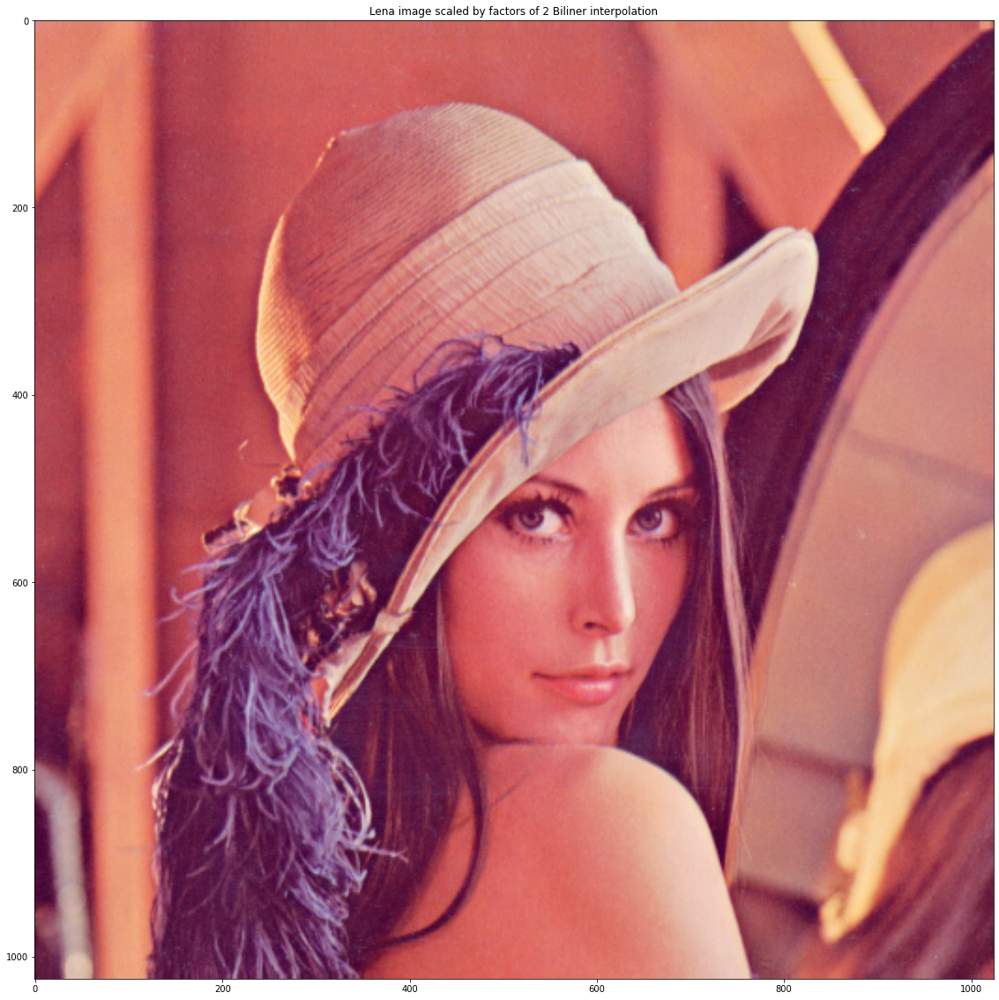

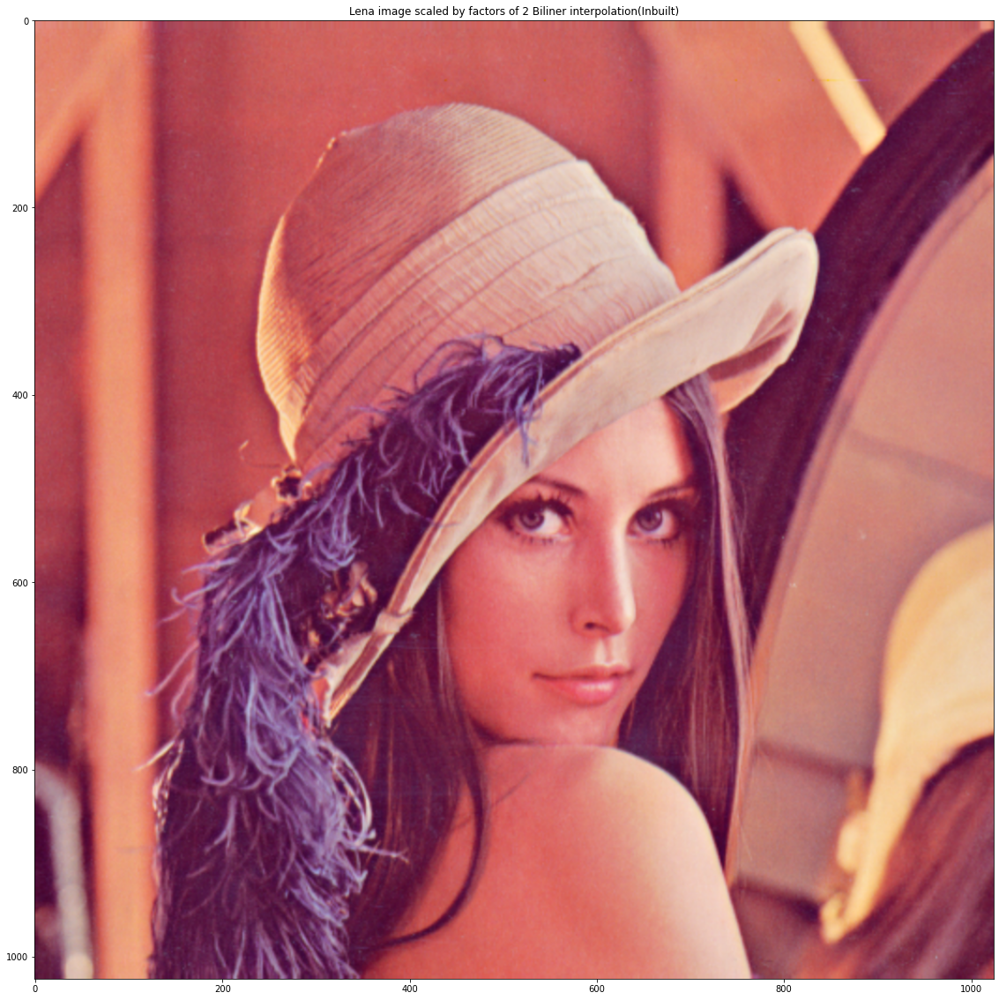

In [50]:
import numpy as np
import cv2
import math

def GetBilinearPixel(imArr, posX, posY):
        out = []
        modXi = int(posX)
        modYi = int(posY)
        modXf = posX - modXi
        modYf = posY - modYi
        modXiPlusOneLim = min(modXi+1,imArr.shape[1]-1)
        modYiPlusOneLim = min(modYi+1,imArr.shape[0]-1)
 
        for chan in range(imArr.shape[2]):
                bl = imArr[modYi, modXi, chan]
                br = imArr[modYi, modXiPlusOneLim, chan]
                tl = imArr[modYiPlusOneLim, modXi, chan]
                tr = imArr[modYiPlusOneLim, modXiPlusOneLim, chan]
 
                b = modXf * br + (1. - modXf) * bl
                t = modXf * tr + (1. - modXf) * tl
                pxf = modYf * t + (1. - modYf) * b
                out.append(int(pxf+0.5))
       
        return out


def bli(img,scale):
        width,height,chan = img.shape
        w1=width
        h1=height
        w2=int(math.floor(w1*scale))
        h2=int(math.floor(h1*scale))

        img_bl = np.empty((w2,h2,chan), dtype=np.uint8)

        x_ratio=float(1/float(scale))
        y_ratio=float(1/float(scale))

        for i in range(0,w2):
           for j in range(0,h2):
                orir = i * x_ratio #Find position in original image
                oric = j * y_ratio
                img_bl[i, j]= GetBilinearPixel(img, oric, orir)
        return img_bl

img = cv2.imread('Lena.png',1)  
blimg1=bli(img,0.5)
blimg2=bli(img,1)
blimg3=bli(img,2)


#######################################
plt.figure(figsize=(5,5))
plt.imshow(cv2.cvtColor(blimg1,cv2.COLOR_BGR2RGB))
plt.title('Lena image scaled by factors of 0.5 Biliner interpolation')
plt.show()

lena_scaled_bilinear_5 = cv2.resize(img,None,fx=0.5,fy=0.5,interpolation=cv2.INTER_LINEAR)
plt.figure(figsize=(5,5))
plt.imshow(cv2.cvtColor(lena_scaled_bilinear_5,cv2.COLOR_BGR2RGB))
plt.title('Lena image scaled by factors of 0.5 Biliner interpolation(Inbuilt)')
plt.show()

sub=cv2.subtract(lena_scaled_bilinear_5,blimg1)
plt.imshow(cv2.cvtColor(sub,cv2.COLOR_BGR2RGB))
plt.title('Difference between Inbuilt and my Biliner interpolation')
plt.show()

#############################
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(blimg2,cv2.COLOR_BGR2RGB))
plt.title('Lena image scaled by factors of 1 Biliner interpolation')
plt.show()

lena_scaled_bilinear1 =cv2.resize(img,None,fx=1.0,fy=1.0,interpolation=cv2.INTER_LINEAR)
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(lena_scaled_bilinear1,cv2.COLOR_BGR2RGB))
plt.title('Lena image scaled by factors of 1 Biliner interpolation(Inbuilt)')
plt.show()

####################################
plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(blimg3,cv2.COLOR_BGR2RGB))
plt.title('Lena image scaled by factors of 2 Biliner interpolation')
plt.show()

lena_scaled_bilinear2 =  cv2.resize(img,None,fx=2.0,fy=2.0,interpolation=cv2.INTER_LINEAR)
plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(lena_scaled_bilinear2,cv2.COLOR_BGR2RGB))
plt.title('Lena image scaled by factors of 2 Biliner interpolation(Inbuilt)')
plt.show()